In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'seaborn'

In [ ]:
df = pd.read_csv("C:/Users/Administrator/Desktop/NEU/ALY 6110/Tentative Datasets/games.csv")

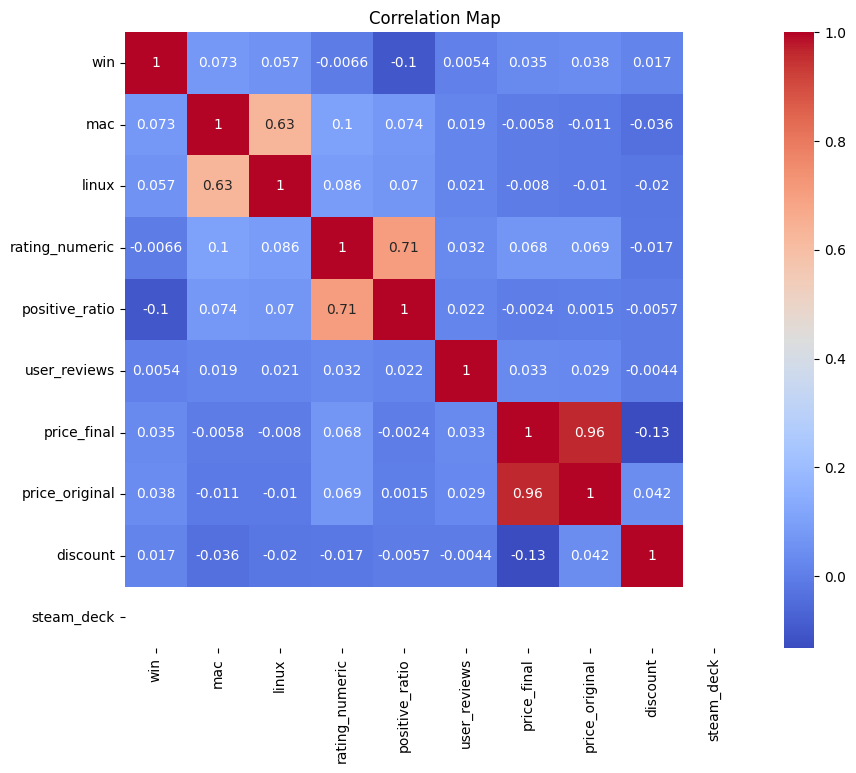

Correlation Table:
                     win       mac     linux  rating_numeric  positive_ratio   
win             1.000000  0.073193  0.057281       -0.006572       -0.103159  \
mac             0.073193  1.000000  0.631408        0.102074        0.074321   
linux           0.057281  0.631408  1.000000        0.086322        0.069806   
rating_numeric -0.006572  0.102074  0.086322        1.000000        0.707630   
positive_ratio -0.103159  0.074321  0.069806        0.707630        1.000000   
user_reviews    0.005391  0.019239  0.020726        0.032243        0.022158   
price_final     0.034808 -0.005751 -0.008031        0.067775       -0.002354   
price_original  0.038009 -0.011258 -0.010227        0.069150        0.001519   
discount        0.016970 -0.036424 -0.019939       -0.016806       -0.005674   
steam_deck           NaN       NaN       NaN             NaN             NaN   

                user_reviews  price_final  price_original  discount   
win                 0.005391 

In [ ]:
# Convert the 'date_release' column to datetime type
df['date_release'] = pd.to_datetime(df['date_release'])

# Convert the 'win', 'mac', 'linux', and 'steam_deck' columns to boolean type
bool_columns = ['win', 'mac', 'linux', 'steam_deck']
df[bool_columns] = df[bool_columns].astype(bool)

# Create a correlation table
correlation_table = df[['win', 'mac', 'linux', 'positive_ratio', 'user_reviews',
                       'price_final', 'price_original', 'discount', 'steam_deck']].corr()

# Map rating values to numerical scale
rating_mapping = {'Overwhemingly Positive': 9, 'Very Positive': 8,'Mostly Positive':7, 'Positive': 6, 'Mixed': 5, 'Negative': 4, 'Mostly Negative' :3,'Very Negative': 2, 'Overwhemingly Negative':1}
df['rating_numeric'] = df['rating'].map(rating_mapping)

# Create a correlation table
correlation_table = df[['win', 'mac', 'linux', 'rating_numeric', 'positive_ratio', 'user_reviews',
                       'price_final', 'price_original', 'discount', 'steam_deck']].corr()

# Remove the 'rating_numeric' column if not needed further
df.drop('rating_numeric', axis=1, inplace=True)


# Create a correlation map using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_table, annot=True, cmap='coolwarm')
plt.title('Correlation Map')
plt.show()

# Print the correlation table
print("Correlation Table:")
print(correlation_table)

In [ ]:
# Import data again and drop nulls

df = pd.read_csv("C:/Users/Administrator/Desktop/NEU/ALY 6110/Tentative Datasets/games.csv")
df.dropna()
df = df.convert_dtypes()
df.dtypes

app_id                     Int64
title             string[python]
date_release      string[python]
win                      boolean
mac                      boolean
linux                    boolean
rating            string[python]
positive_ratio             Int64
user_reviews               Int64
price_final              Float64
price_original           Float64
discount                   Int64
steam_deck               boolean
dtype: object

In [ ]:
df

,app_id,title,date_release,win,mac,linux,rating,positive_ratio,user_reviews,price_final,price_original,discount,steam_deck
0,10090,Call of Duty: World at War,2008-11-18,True,False,False,Very Positive,92,37039,19.99,19.99,0,True
1,13500,Prince of Persia: Warrior Within™,2008-11-21,True,False,False,Very Positive,84,2199,9.99,9.99,0,True
2,22364,BRINK: Agents of Change,2011-08-03,True,False,False,Positive,85,21,2.99,2.99,0,True
3,113020,Monaco: What's Yours Is Mine,2013-04-24,True,True,True,Very Positive,92,3722,14.99,14.99,0,True
4,226560,Escape Dead Island,2014-11-18,True,False,False,Mixed,61,873,14.99,14.99,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48781,1581480,Humanity,2023-05-15,True,False,False,Very Positive,94,106,29.99,29.99,0,True
48782,1964040,Do Not Feed the Monkeys 2099,2023-05-25,True,True,False,Positive,95,21,12.74,14.99,15,True
48783,1353521,Brawlhalla: Battle Pass Classic 2: Synthwave R...,2020-09-17,True,True,False,Very Positive,93,165,9.99,9.99,0,True
48784,2311190,Garten of Banban 3,2023-05-05,True,False,False,Mostly Positive,70,1225,4.99,4.99,0,True


Now we have performed some data cleaning and EDA for our data set, it is time for some modelings. We want to discuss three questions:
1. How are game prices performing compare to the CPI index?
2. How many clusters are there in the game market? How can they be clustered?
3. What are the requirements to make a game's rating overwhemlingly positive?
4. Is it possible to design a graph to depict the relationship between the games?

Lets first deal with the first question.

In [ ]:
df_cpi = pd.read_excel("C:/Users/Administrator/Desktop/NEU/ALY 6110/Tentative Datasets/cpi.xlsx")
import matplotlib.pyplot as plt
df_prices = df[['date_release', 'price_original']].copy()
df_prices['date_release'] = pd.to_datetime(df_prices['date_release'])

# Group the data by year and calculate the mode game price for each year:
df_prices['year'] = df_prices['date_release'].dt.year
df_avg_prices = df_prices.groupby('year')['price_original'].mean().reset_index()

# Merge
df_merged = pd.merge(df_avg_prices, df_cpi, left_on='year', right_on='Year', how='inner')


In [ ]:
df_merged

,year,price_original,Year,CPI
0,1999,3.326667,1999,100.000000
1,2000,7.49,2000,102.000000
2,2001,4.99,2001,104.300000
3,2002,14.99,2002,105.600000
4,2003,5.99,2003,107.800000
5,2004,8.74,2004,110.500000
6,2005,3.66,2005,113.700000
7,2006,8.544464,2006,117.000000
8,2007,8.271341,2007,119.957000
9,2008,9.435655,2008,124.433000


Mean of game price every year compare to CPI

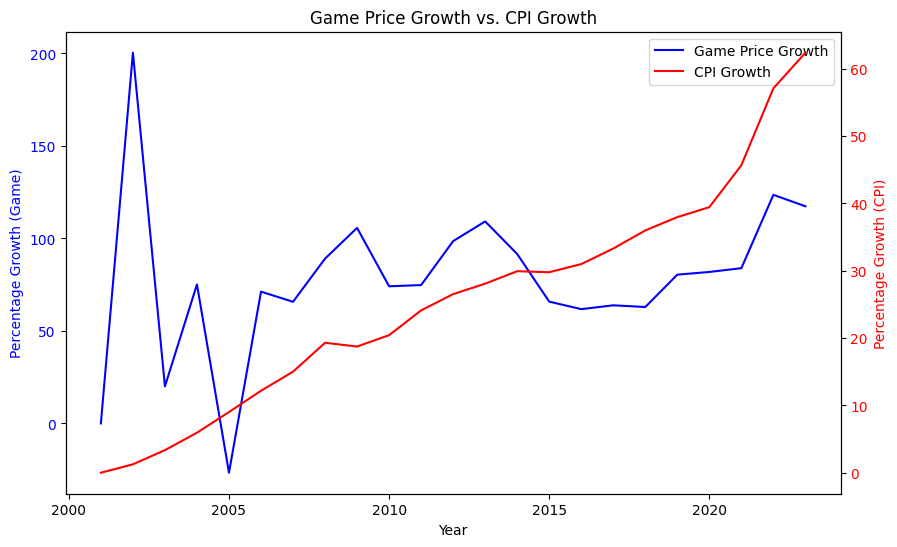

In [ ]:
# Calculate the percentage change for average game prices and CPI index
df_merged['price_change'] = df_merged['price_original'].pct_change() * 100
df_merged['cpi_change'] = df_merged['CPI'].pct_change() * 100

df_merged.dropna(inplace= True)

# Calculate the percentage growth relative to the first entry
df_merged['price_growth'] = (df_merged['price_original'] - df_merged['price_original'].iloc[0]) / df_merged['price_original'].iloc[0] * 100
df_merged['cpi_growth'] = (df_merged['CPI'] - df_merged['CPI'].iloc[0]) / df_merged['CPI'].iloc[0] * 100

# Create the figure and axis objects
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot the percentage growth of average game prices on the first y-axis
ax1.plot(df_merged['year'], df_merged['price_growth'], label='Game Price Growth', color='blue')
ax1.set_xlabel('Year')
ax1.set_ylabel('Percentage Growth (Game)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the percentage growth of CPI index on the second y-axis
ax2.plot(df_merged['year'], df_merged['cpi_growth'], label='CPI Growth', color='red')
ax2.set_ylabel('Percentage Growth (CPI)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add a legend
lines = ax1.get_lines() + ax2.get_lines()
ax1.legend(lines, [line.get_label() for line in lines], loc='best')

# Title the plot
plt.title('Game Price Growth vs. CPI Growth')

# Display the plot
plt.show()

In [ ]:
from scipy.stats import mode
df_mode_prices = df_prices.groupby(df_prices['date_release'].dt.year)['price_original'].apply(lambda x: mode(x)[0][0]).reset_index()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_34172\4080546539.py:2: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  df_mode_prices = df_prices.groupby(df_prices['date_release'].dt.year)['price_original'].apply(lambda x: mode(x)[0][0]).reset_index()
C:\Users\Administrator\AppData\Local\Temp\ipykernel_34172\4080546539.py:2: DeprecationWarning: Support for non-numeric arrays has been deprecated as of SciPy 1.9.0 and will be removed in 1.11.0. `pandas.DataFrame.mode` can be used instead, see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.mode.html.
  df_mode_prices = df_prices.groupby(df_prices['date_release'

In [ ]:
df_cpi

,Year,CPI
0,1999,100.000000
1,2000,102.000000
2,2001,104.300000
3,2002,105.600000
4,2003,107.800000
5,2004,110.500000
6,2005,113.700000
7,2006,117.000000
8,2007,119.957000
9,2008,124.433000


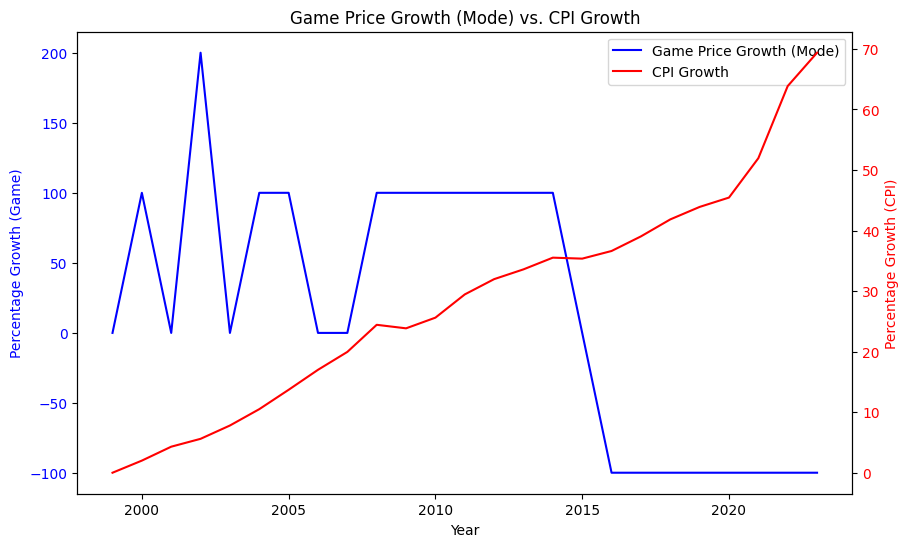

In [ ]:
# Merge the mode prices and CPI index DataFrames
df_merged = pd.merge(df_mode_prices, df_cpi, left_on='date_release', right_on='Year', how='inner')

# Calculate the percentage growth relative to the first entry
df_merged['price_growth'] = (df_merged['price_original'] - df_merged['price_original'].iloc[0]) / df_merged['price_original'].iloc[0] * 100
df_merged['cpi_growth'] = (df_merged['CPI'] - df_merged['CPI'].iloc[0]) / df_merged['CPI'].iloc[0] * 100

# Create the figure and axis objects
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot the percentage growth of mode game prices on the first y-axis
ax1.plot(df_merged['Year'], df_merged['price_growth'], label='Game Price Growth (Mode)', color='blue')
ax1.set_xlabel('Year')
ax1.set_ylabel('Percentage Growth (Game)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the percentage growth of CPI index on the second y-axis
ax2.plot(df_merged['Year'], df_merged['cpi_growth'], label='CPI Growth', color='red')
ax2.set_ylabel('Percentage Growth (CPI)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add a legend
lines = ax1.get_lines() + ax2.get_lines()
ax1.legend(lines, [line.get_label() for line in lines], loc='best')

# Title the plot
plt.title('Game Price Growth (Mode) vs. CPI Growth')

# Display the plot
plt.show()

How many clusters are there in the game market? How can they be clustered?

C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

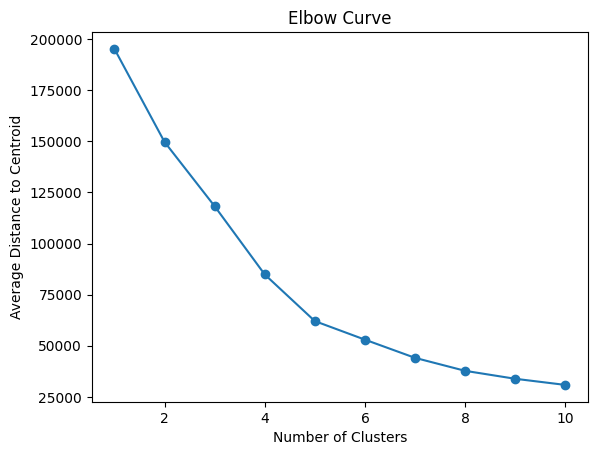

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


# Select the relevant features for clustering
features = ['price_final', 'positive_ratio', 'user_reviews', 'discount']

# Extract the feature columns from the DataFrame
X = df[features]

# Perform feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Determine the optimal number of clusters using the elbow method
# Define the range of number of clusters to test
max_clusters = 10
distortions = []

for n_clusters in range(1, max_clusters + 1):
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_scaled)
    
    # Calculate the average distance to centroid (inertia)
    distortion = kmeans.inertia_
    distortions.append(distortion)

# Plot the elbow curve
plt.plot(range(1, max_clusters + 1), distortions, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Average Distance to Centroid')
plt.title('Elbow Curve')
plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Set the desired number of clusters based on your analysis
n_clusters = 4

# Apply K-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_scaled)

# Get the cluster labels assigned to each game
cluster_labels = kmeans.labels_

# Add the cluster labels to the original DataFrame
df['cluster'] = cluster_labels

# Analyze the characteristics of each cluster
cluster_analysis = df.groupby('cluster')[features].mean()
print(cluster_analysis)

         price_final  positive_ratio  user_reviews   discount
cluster                                                      
0           8.447951        53.72762    408.118969   0.284204
1           9.306593       86.809022   2175.162382   0.491823
2           3.109127       76.632135   1104.845968  68.594382
3              14.99            88.0     6941137.0        0.0


C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

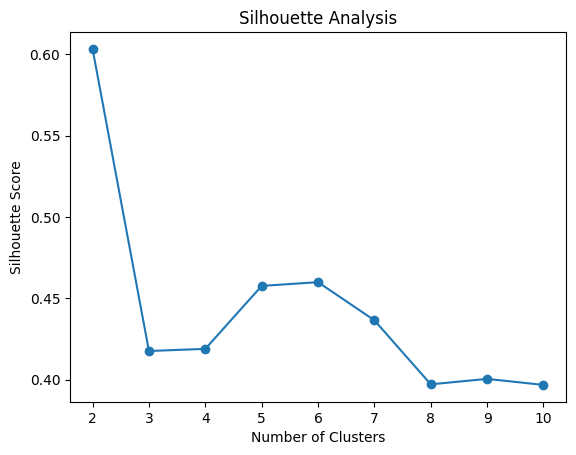

In [ ]:
from sklearn.metrics import silhouette_score
# Silhouette Analysis:
max_clusters = 10
silhouette_scores = []

for n_clusters in range(2, max_clusters + 1):
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')
plt.show()

In [ ]:
# Set the desired number of clusters based on your analysis
n_clusters = 5

# Apply K-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_scaled)

# Get the cluster labels assigned to each game
cluster_labels = kmeans.labels_

# Add the cluster labels to the original DataFrame
df['cluster'] = cluster_labels

# Analyze the characteristics of each cluster
cluster_analysis = df.groupby('cluster')[features].mean()
print(cluster_analysis)

         price_final  positive_ratio  user_reviews   discount
cluster                                                      
0            6.74068       87.085573   1305.962826     0.5121
1           6.524542       53.730024    317.856944   0.304949
2              14.99            88.0     6941137.0        0.0
3           3.084962       76.650832   1106.504387  68.642057
4          38.516732       77.917796   9631.360047   0.271951


C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


What are the requirements to make a game's rating overwhemlingly positive?

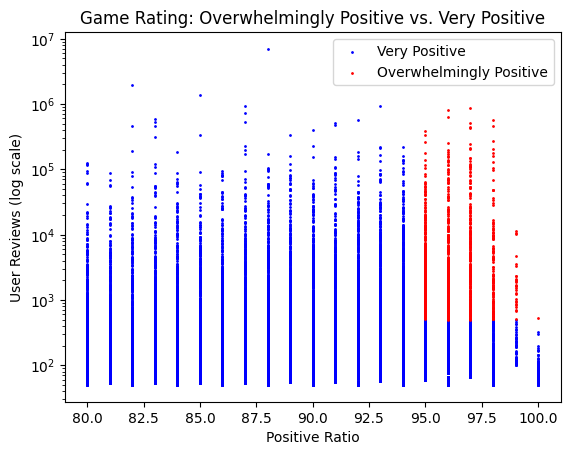

In [ ]:
# Select the relevant columns for analysis
data = df[['positive_ratio', 'user_reviews', 'rating']]

# Filter the data for "Overwhelmingly Positive" and "Very Positive" games
overwhelmingly_positive = data[data['rating'] == 'Overwhelmingly Positive']
very_positive = data[data['rating'] == 'Very Positive']

dot_size = 1

# Create the scatter plot
plt.scatter(very_positive['positive_ratio'], very_positive['user_reviews'], color='blue', label='Very Positive', s=dot_size)
plt.scatter(overwhelmingly_positive['positive_ratio'], overwhelmingly_positive['user_reviews'], color='red', label='Overwhelmingly Positive', s=dot_size)

# Set the y-axis to a logarithmic scale for better visualization
plt.yscale('log')

# Add labels and a legend
plt.xlabel('Positive Ratio')
plt.ylabel('User Reviews (log scale)')
plt.title("Game Rating: Overwhelmingly Positive vs. Very Positive")
plt.legend()

# Adjust the plot to prioritize visibility of the "Overwhelmingly Positive" group
ax = plt.gca()
ax.set_zorder(ax.get_zorder() + 1)
ax.patch.set_visible(False)

# Display the plot
plt.show()


In [ ]:
data_test = data[((data['rating'] == 'Overwhelmingly Positive') | (data['rating'] == 'Very Positive')) & (data['positive_ratio'] >= 95)]
very_positive_max = data_test[data_test['rating'] == 'Very Positive']['user_reviews'].max()
overwhelmingly_positive_min = data_test[data_test['rating'] == 'Overwhelmingly Positive']['user_reviews'].min()

print("Maximum user_reviews for Very Positive:", very_positive_max)
print("Minimum user_reviews for Overwhelmingly Positive:", overwhelmingly_positive_min)


Maximum user_reviews for Very Positive: 499
Minimum user_reviews for Overwhelmingly Positive: 500


Is it possible to design a graph to depict the relationship between the games?
I am chosing only those 'rating' == 'Overwhelmingly Positive' otherwise it is too slow.

In [ ]:
import pandas as pd
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity


# Filter the dataframe based on positive ratio
df_graph = df[df['rating'] == 'Overwhelmingly Positive'].reset_index(drop=True)

# Create an empty graph
G = nx.Graph()

# Iterate over the filtered dataset and add nodes to the graph
for index, row in df_graph.iterrows():
    game_id = row['app_id']
    title = row['title']
    G.add_node(game_id, title=title)

# Calculate similarity based on user reviews and price
def calculate_similarity(game1, game2):
    reviews_similarity = cosine_similarity([[game1['user_reviews'], game1['price_final']]],
                                           [[game2['user_reviews'], game2['price_final']]])
    return reviews_similarity[0][0]

# Define a similarity threshold for connecting nodes
similarity_threshold = 0.8

# Iterate over the games and connect similar games with edges
for i in range(len(df_graph)):
    for j in range(i+1, len(df_graph)):
        print(i, ' on ', j)
        game1 = df_graph.loc[i]
        game2 = df_graph.loc[j]
        similarity = calculate_similarity(game1, game2)
        if similarity > similarity_threshold:
            G.add_edge(game1['app_id'], game2['app_id'], similarity=similarity)


0  on  1
0  on  2
0  on  3
0  on  4
0  on  5
0  on  6
0  on  7
0  on  8
0  on  9
0  on  10
0  on  11
0  on  12
0  on  13
0  on  14
0  on  15
0  on  16
0  on  17
0  on  18
0  on  19
0  on  20
0  on  21
0  on  22
0  on  23
0  on  24
0  on  25
0  on  26
0  on  27
0  on  28
0  on  29
0  on  30
0  on  31
0  on  32
0  on  33
0  on  34
0  on  35
0  on  36
0  on  37
0  on  38
0  on  39
0  on  40
0  on  41
0  on  42
0  on  43
0  on  44
0  on  45
0  on  46
0  on  47
0  on  48
0  on  49
0  on  50
0  on  51
0  on  52
0  on  53
0  on  54
0  on  55
0  on  56
0  on  57
0  on  58
0  on  59
0  on  60
0  on  61
0  on  62
0  on  63
0  on  64
0  on  65
0  on  66
0  on  67
0  on  68
0  on  69
0  on  70
0  on  71
0  on  72
0  on  73
0  on  74
0  on  75
0  on  76
0  on  77
0  on  78
0  on  79
0  on  80
0  on  81
0  on  82
0  on  83
0  on  84
0  on  85
0  on  86
0  on  87
0  on  88
0  on  89
0  on  90
0  on  91
0  on  92
0  on  93
0  on  94
0  on  95
0  on  96
0  on  97
0  on  98
0  on  99
0  on  100
0  on  1

In [ ]:
# Example: Find communities using the Louvain algorithm
communities = nx.algorithms.community.modularity_max.greedy_modularity_communities(G)
communities

In [ ]:
degree_centrality = nx.degree_centrality(G)
# Find the maximum degree centrality
max_degree_centrality = max(degree_centrality.values())

# Find the minimum degree centrality
min_degree_centrality = min(degree_centrality.values())

# Print the maximum and minimum degree centrality values
print("Maximum Degree Centrality:", max_degree_centrality)
print("Minimum Degree Centrality:", min_degree_centrality)

Maximum Degree Centrality: 1.0
Minimum Degree Centrality: 1.0


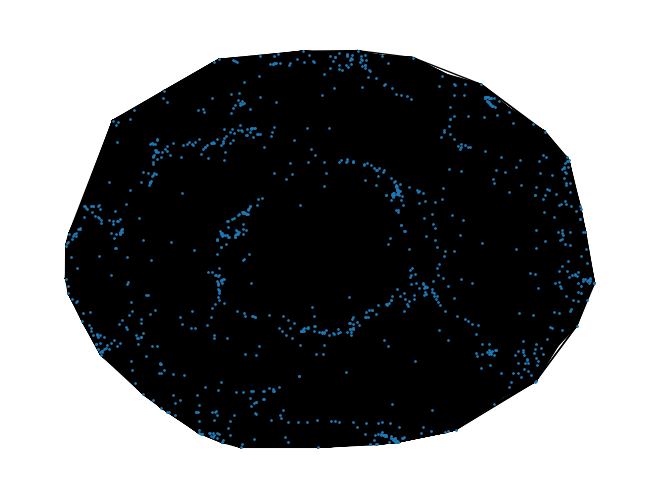

In [ ]:
nx.draw(G, with_labels=False, node_size=1)